In [1]:
import numpy as np
import pandas as pd
from sklearn import datasets
from sklearn.preprocessing import LabelEncoder

In [2]:
bc = datasets.load_breast_cancer()

X = bc['data']
y = bc['target']

df = pd.DataFrame(X)
df.columns = bc['feature_names']

le = LabelEncoder()
le.fit(bc.target_names)
df['type'] = le.inverse_transform(y)

df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,type
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,benign
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,benign
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,benign
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,benign
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,benign


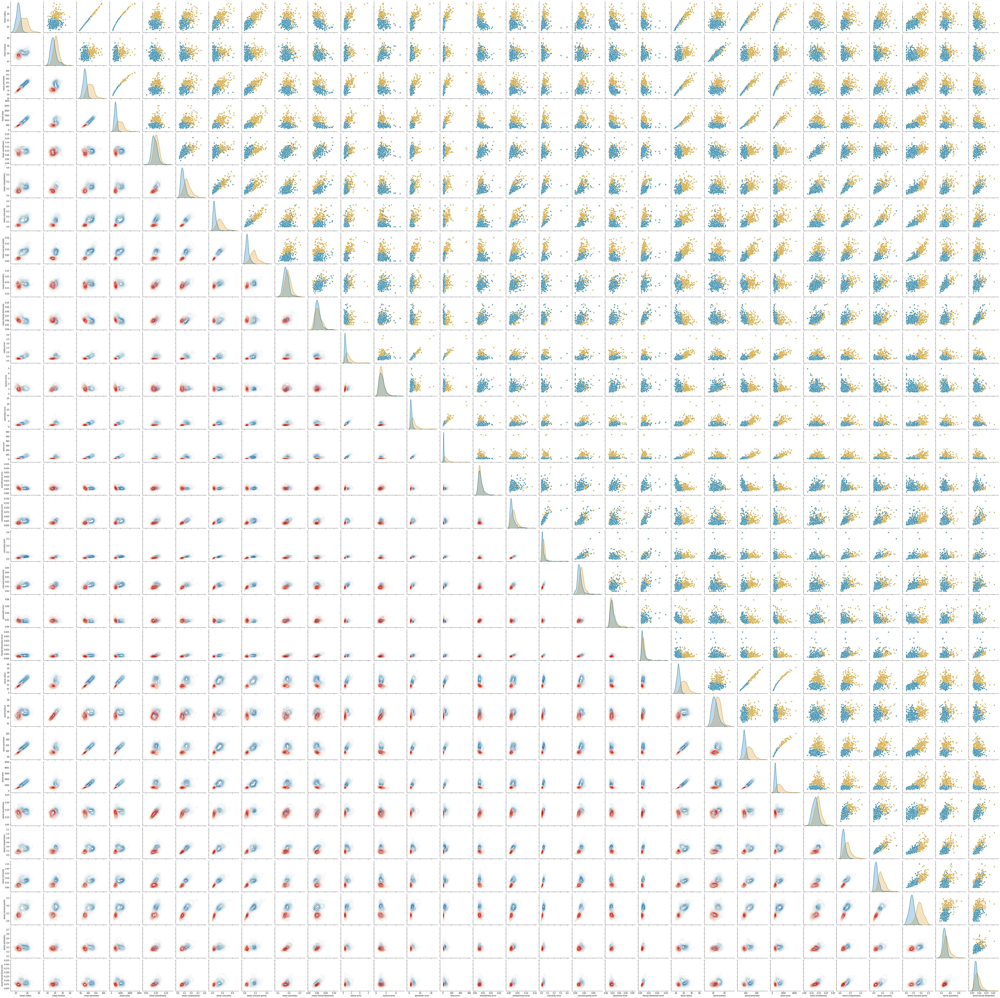

In [26]:
import seaborn as sns

g = sns.PairGrid(df, hue="type", hue_kws={"cmap": ["Blues", "Reds",]}, palette=[sns.color_palette("colorblind")[1], sns.color_palette("colorblind")[0]], diag_sharey=False)
g = g.map_diag(sns.kdeplot, shade=True)
g = g.map_lower(sns.kdeplot, shade_lowest=False)
g = g.map_upper(sns.scatterplot)

In [27]:
import matplotlib.patheffects as PathEffects
import matplotlib.pyplot as plt

def scatter(x, labels, names):
    palette = np.array([sns.color_palette("colorblind")[1], sns.color_palette("colorblind")[0]])

    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot()
    sc = ax.scatter(x[:,0], x[:,1], c=palette[list(labels)], alpha=0.7)
    
    ax.axis('off')

    txts = []
    for i in range(len(names)):
        # Ogni label viene posta nella mediana dei punti corrispondenti.
        xtext, ytext = np.median(x[labels == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(names[i]), fontsize=18)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)
    
    return f, ax, sc, txts

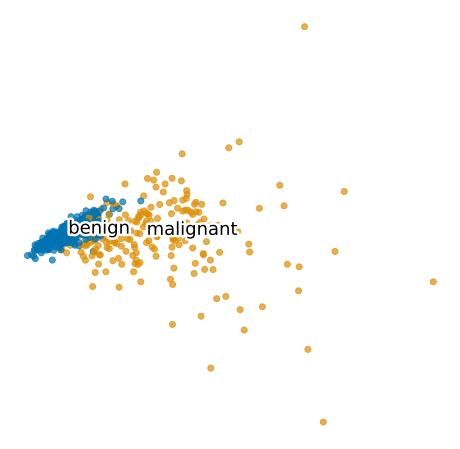

In [28]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

fig_pca, ax_pca, _, _ = scatter(X_pca, y.astype(int), bc.target_names)
plt.show()

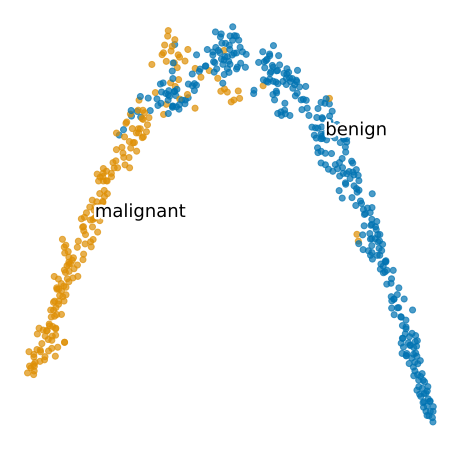

In [37]:
from sklearn.manifold import TSNE

X_tsne = TSNE(perplexity=50).fit_transform(X)

fig_tsne, ax_tsne, _, _ = scatter(X_tsne, y.astype(int), bc.target_names)
plt.show()